# Setting up dataset

Before we do any exploration of the dataset collected in the previous notebook, we must clean the dataset. This includes:
1. Filling in the NULL values
2. Dropping unneccesary columns that cannot contribute to data analysis
3. Generating full text column as a concatenation of title and selftext columns
4. Cleaning up the full text column which contains links and escape sequences


We will beginning by importing the dataset and getting an idea of what it looks like.

In [1]:
import pandas as pd
import math
import numpy as np

pd.set_option('display.max_colwidth', None) # setting so that we can see full text outputs

df = pd.read_csv('reddit_data.csv', low_memory=False)

df.head(10)

,Unnamed: 0,title,flair,score,num_comments,author,is_original_content,created_utc,self_post,self_text,over_18
0,0.0,Even the poorest are supporting Modi in this.,Politics,64.0,78.0,hungarywolf,False,1.586106e+09,False,NaN,False
1,1.0,Someone tried to sell Statue of Unity on Olx. Absolute MadLad,Non-Political,50.0,143.0,Athar147,False,1.586106e+09,False,NaN,False
2,2.0,Captured India with my phone.,Photography,49.0,202.0,random_saiyajin,False,1.586102e+09,False,NaN,False
3,3.0,The Irony,NaN,43.0,109.0,blue_mark,False,1.586101e+09,True,My entire house has it's lights turned off and I'm in my room with the lights on. Yet somehow I feel I'm in the dark with all the stupidity and blindness that's around.,False
4,4.0,You guys are too impure to understand Modi Ji's 9pm for 9 mins idea.,Coronavirus,39.0,81.0,AdmiralSP,False,1.586101e+09,True,"It's very scientific.\nI'm a scientist.\n\nEven UNESCO had called this the best master stroke.\n\nPlease read.\n\nYou want to know full secret about 9 pm 9 minutes ?\n\nHow many planets are there?\n9, the Nava graha.\n\nThe Navagraha are very fast.\nAnd we have corona because they are furious.\n\nHow many parts of Fast and Furious ?\n9 \n\nBut all these cars run on petrol... where does petrol come from?\nFossilized wood.\nNow the question is: Would Elijah?\nYes, Elijah Wood.\n\nAnd what movie is he in? \n""9"".\n\nAnd this is where things get complicated. \nWe need to talk about astronomy.\nModi ji was giving lecture about vedic astronomy to NASA.\nThat's when he realised this.\n\nWhat does NASA study?\nStars.\n\nWhat are stars called in India?\nTara.\n\nWho is a famous tara?\nHeroine Nayantara.\n\nLet's split that \nNayan - tara \nNine tara...\n9.\n\nWhat movie is she in?\nDarbar.\n\nWhich released on 9th of January.\nAgain. 9.\n\nWho is the hero in Darbar?\n\nSuper star: Rajnikant.\n\nWhich show has he been in?\n\nMan vs wild.\n\nAnd who else has been in Man vs Wild?\n\nYep. You guessed it right. \n\nNarendra Damodardas Modi Ji.\n\nA full circle.\nCheck mate. \n\n\nIf you can even disprove this science I will challenge.\nOpen challange. \n\nYou're all too impure, you nonveg crooked brain can never understand this concept.",False
5,5.0,BSF soldier lights candles in his bunker.,| Unverified Content / Disreputed Source |,35.0,4.0,zxkool,False,1.586107e+09,False,NaN,False
6,6.0,Posting again because stupidity was on show tonight.,Coronavirus,34.0,21.0,msbuttergourd,False,1.586108e+09,False,NaN,False
7,7.0,"During #9PM9minute All India demand of electricity came down to 85 GW. A drop of whopping 32 GW. It was much beyond the expected drop of 12 GW. However a robust system, flawless planning by engineers &amp; close monitoring by @MinOfPower ensured no disruption. | CEO Central Electricity Supply Utility o",Non-Political,32.0,107.0,The_andh_bhakth,False,1.586114e+09,False,NaN,False
8,8.0,Fuck this. Our country will never learn.,Coronavirus,32.0,349.0,youdidWHaAtnow,False,1.586101e+09,True,People are bursting crackers. They're playing drums on the street like it's some festival. AGAIN.\n\nI'm so done with this country man.\n\nHas the education system really failed us this bad?\n\n\nI hope all this goes viral and the rest of the world knows how dumb we are. We need to hang our heads in shame.,False
9,9.0,"Antila World's most expensive home - lights off, Dias on",Coronavirus,31.0,61.0,neilupinto,False,1.586105e+09,False,NaN,False


Let us get an idea of the NULL values in each column

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144001 entries, 0 to 144000
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Unnamed: 0           144000 non-null  float64
 1   title                144001 non-null  object 
 2   flair                113248 non-null  object 
 3   score                144000 non-null  float64
 4   num_comments         144000 non-null  float64
 5   author               144000 non-null  object 
 6   is_original_content  73358 non-null   object 
 7   created_utc          144000 non-null  float64
 8   self_post            144000 non-null  object 
 9   self_text            32990 non-null   object 
 10  over_18              143999 non-null  object 
dtypes: float64(4), object(7)
memory usage: 12.1+ MB


We see that the columns that have a high number of NULL values are **flair**,**is_original_content** and **self_text**. 

1. **flair** - This is an integral part of our data analysis and NULL values are just posts with no flair assigned to them.
2. **is_original_content** - It seems that is_original_content wasn't a post variable for some time and hence has a NULL value for half of the posts. Hence we will drop the column entirely.
3. **self_text** - self_text being NULL just means that the post only had a title and no body of text. We will drop this column once we generate full_text column

In [3]:
df.drop(columns=['is_original_content'], inplace=True)
df.drop(columns=['Unnamed: 0'], inplace=True)

We want to concatenate title and self_text to have full_text column having the entire text of a post. We will need this for data analysis but even more importantly for flair prediction further. Before we perform the concatenation, let us see the different values of self_text to see if there is anything interesting

In [4]:
df['self_text'].value_counts(dropna=False)

NaN                                                                                                                                                                                                                                                                                                                                                                                                                111011
[removed]                                                                                                                                                                                                                                                                                                                                                                                                            3787
[deleted]                                                                                                                                                                           

We see that there are almost 7000 posts whose text has been either removed or deleted. Let us convert them to NaN first

In [5]:
df['self_text'] = df['self_text'].replace({"[deleted]": float("nan"), "[removed]": float("nan")})

We now make our full_text column. Once we have this column, we can get rid of title and self_text columns as they are not of any further use.

In [6]:
df['self_text'] = df['self_text'].replace({float("nan"): " "})
df['full_text'] = df['title'] + " " + df['self_text']
df.drop(columns=['title'], inplace=True)
df.drop(columns=['self_text'], inplace=True)
df.head(5)

,flair,score,num_comments,author,created_utc,self_post,over_18,full_text
0,Politics,64.0,78.0,hungarywolf,1.586106e+09,False,False,Even the poorest are supporting Modi in this.
1,Non-Political,50.0,143.0,Athar147,1.586106e+09,False,False,Someone tried to sell Statue of Unity on Olx. Absolute MadLad
2,Photography,49.0,202.0,random_saiyajin,1.586102e+09,False,False,Captured India with my phone.
3,NaN,43.0,109.0,blue_mark,1.586101e+09,True,False,The Irony My entire house has it's lights turned off and I'm in my room with the lights on. Yet somehow I feel I'm in the dark with all the stupidity and blindness that's around.
4,Coronavirus,39.0,81.0,AdmiralSP,1.586101e+09,True,False,"You guys are too impure to understand Modi Ji's 9pm for 9 mins idea. It's very scientific.\nI'm a scientist.\n\nEven UNESCO had called this the best master stroke.\n\nPlease read.\n\nYou want to know full secret about 9 pm 9 minutes ?\n\nHow many planets are there?\n9, the Nava graha.\n\nThe Navagraha are very fast.\nAnd we have corona because they are furious.\n\nHow many parts of Fast and Furious ?\n9 \n\nBut all these cars run on petrol... where does petrol come from?\nFossilized wood.\nNow the question is: Would Elijah?\nYes, Elijah Wood.\n\nAnd what movie is he in? \n""9"".\n\nAnd this is where things get complicated. \nWe need to talk about astronomy.\nModi ji was giving lecture about vedic astronomy to NASA.\nThat's when he realised this.\n\nWhat does NASA study?\nStars.\n\nWhat are stars called in India?\nTara.\n\nWho is a famous tara?\nHeroine Nayantara.\n\nLet's split that \nNayan - tara \nNine tara...\n9.\n\nWhat movie is she in?\nDarbar.\n\nWhich released on 9th of January.\nAgain. 9.\n\nWho is the hero in Darbar?\n\nSuper star: Rajnikant.\n\nWhich show has he been in?\n\nMan vs wild.\n\nAnd who else has been in Man vs Wild?\n\nYep. You guessed it right. \n\nNarendra Damodardas Modi Ji.\n\nA full circle.\nCheck mate. \n\n\nIf you can even disprove this science I will challenge.\nOpen challange. \n\nYou're all too impure, you nonveg crooked brain can never understand this concept."


As we can see, there are escape sequences and links in our data that we must remove. This is why we have to perform cleanup of the full_text column

In [7]:
import re
def preprocess(text):
    text = text.str.replace("(<br/>)", ' ')
    text = text.str.replace('(<a).*(>).*(</a>)', ' ')
    text = text.str.replace('(&amp)', ' ')
    text = text.str.replace('(&gt)', ' ')
    text = text.str.replace('(&lt)', ' ')
    text = text.str.replace('(\xa0)', ' ')
    text = text.str.replace("\n", " ")
    return text
df['full_text'] = preprocess(df['full_text'])
df['full_text'] = df['full_text'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])
df.head(5)

,flair,score,num_comments,author,created_utc,self_post,over_18,full_text
0,Politics,64.0,78.0,hungarywolf,1.586106e+09,False,False,Even the poorest are supporting Modi in this.
1,Non-Political,50.0,143.0,Athar147,1.586106e+09,False,False,Someone tried to sell Statue of Unity on Olx. Absolute MadLad
2,Photography,49.0,202.0,random_saiyajin,1.586102e+09,False,False,Captured India with my phone.
3,NaN,43.0,109.0,blue_mark,1.586101e+09,True,False,The Irony My entire house has it's lights turned off and I'm in my room with the lights on. Yet somehow I feel I'm in the dark with all the stupidity and blindness that's around.
4,Coronavirus,39.0,81.0,AdmiralSP,1.586101e+09,True,False,"You guys are too impure to understand Modi Ji's 9pm for 9 mins idea. It's very scientific. I'm a scientist. Even UNESCO had called this the best master stroke. Please read. You want to know full secret about 9 pm 9 minutes ? How many planets are there? 9, the Nava graha. The Navagraha are very fast. And we have corona because they are furious. How many parts of Fast and Furious ? 9 But all these cars run on petrol... where does petrol come from? Fossilized wood. Now the question is: Would Elijah? Yes, Elijah Wood. And what movie is he in? ""9"". And this is where things get complicated. We need to talk about astronomy. Modi ji was giving lecture about vedic astronomy to NASA. That's when he realised this. What does NASA study? Stars. What are stars called in India? Tara. Who is a famous tara? Heroine Nayantara. Let's split that Nayan - tara Nine tara... 9. What movie is she in? Darbar. Which released on 9th of January. Again. 9. Who is the hero in Darbar? Super star: Rajnikant. Which show has he been in? Man vs wild. And who else has been in Man vs Wild? Yep. You guessed it right. Narendra Damodardas Modi Ji. A full circle. Check mate. If you can even disprove this science I will challenge. Open challange. You're all too impure, you nonveg crooked brain can never understand this concept."


Great! Let's move on to the flair column now. Let's see the distribution of posts by flair and see if we can find something interesting

In [8]:
df['flair'].value_counts(dropna=False).head(50)

Non-Political                      34038
NaN                                30753
Politics                           30192
AskIndia                           12640
Policy/Economy                      7151
Business/Finance                    4185
Science/Technology                  3409
[R]eddiquette                       3351
Demonetization                      2495
Policy                              2134
Sports                              1660
Science &amp; Technology            1207
Photography                         1128
Coronavirus                         1019
Food                                 862
Entertainment                        861
Policy &amp; Economy                 857
Scheduled                            819
Repost.                              507
Not about India.                     474
Not Original Title.                  334
Business &amp; Finance               328
Unverified Content.                  244
CAA-NRC                              243
Repost;         

Okay, we observe two things from here:

1. Certain flairs are repeated and just shown differently due to escape sequences. For eg. we have Policy/Economy and Policy &amp economy which are both representing the same thing. So we will map such repetitions to only one such flair.

2. After the first 10 flairs, the quantity of relevant posts from each flair is extremely low and hence would only contribute negatively to any machine learning model and would rarely be present. So, we will restrict our training and testing datasets for the ML model to posts from the top 10 flairs.


In [9]:
df['flair'] = df['flair'].replace({"Science &amp; Technology": "Science/Technology", "Policy &amp; Economy": "Policy/Economy", "Business &amp; Finance": "Business/Finance", "Policy": "Policy/Economy", "Demonetization": "Policy/Economy", "CAA-NRC": "Policy/Economy"})
df['flair'].value_counts(dropna=False).head(50)

Non-Political                              34038
NaN                                        30753
Politics                                   30192
Policy/Economy                             12880
AskIndia                                   12640
Science/Technology                          4616
Business/Finance                            4513
[R]eddiquette                               3351
Sports                                      1660
Photography                                 1128
Coronavirus                                 1019
Food                                         862
Entertainment                                861
Scheduled                                    819
Repost.                                      507
Not about India.                             474
Not Original Title.                          334
Unverified Content.                          244
Repost;                                      214
Not in English.                              158
Old.                

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144001 entries, 0 to 144000
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   flair         113248 non-null  object 
 1   score         144000 non-null  float64
 2   num_comments  144000 non-null  float64
 3   author        144000 non-null  object 
 4   created_utc   144000 non-null  float64
 5   self_post     144000 non-null  object 
 6   over_18       143999 non-null  object 
 7   full_text     144001 non-null  object 
dtypes: float64(3), object(5)
memory usage: 8.8+ MB


Due to some glitch on reddit or due to a deletion of a post, there is one post with no details about anything and another post with a missing entry in over_18. Let us remove these two posts

In [11]:
sr = pd.isnull(df['created_utc'])
sr.loc[sr==True]

71774    True
Name: created_utc, dtype: bool

In [12]:
df.drop(71774, axis=0, inplace=True)

In [13]:
sr = pd.isnull(df['over_18'])
sr.loc[sr==True]

71773    True
Name: over_18, dtype: bool

In [14]:
df.drop(71773, axis=0, inplace=True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 143999 entries, 0 to 144000
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   flair         113247 non-null  object 
 1   score         143999 non-null  float64
 2   num_comments  143999 non-null  float64
 3   author        143999 non-null  object 
 4   created_utc   143999 non-null  float64
 5   self_post     143999 non-null  object 
 6   over_18       143999 non-null  object 
 7   full_text     143999 non-null  object 
dtypes: float64(3), object(5)
memory usage: 9.9+ MB


Finally, we are done with the preparation of this dataset. Before we begin with the data analysis, we will do two last things:
1. Form the training set to be used for flair prediction. This will consist of posts belonging to one of the top 10 flairs

2. Rename the associated flair for all posts not belonging to the top 10 flairs to 'other'

In [16]:
sr = df['flair'].value_counts()
total_flair_list = sr.index.tolist()
top_flair_list = total_flair_list[0:10]
filtered_bool_series = df["flair"].isin(top_flair_list)
final_dataset = df[filtered_bool_series]
final_dataset = final_dataset.reset_index(drop=True)
final_dataset.to_csv('dataset_final.csv')
final_dataset.shape

(106036, 8)

In [17]:
to_rename_flair_list = total_flair_list[10:]
filtered_bool_series = df["flair"].isin(to_rename_flair_list)
df.loc[filtered_bool_series,'flair'] = 'other'
df['flair'].value_counts(dropna=False)

Non-Political         34037
NaN                   30752
Politics              30192
Policy/Economy        12880
AskIndia              12640
other                  7211
Science/Technology     4616
Business/Finance       4513
[R]eddiquette          3351
Sports                 1660
Photography            1128
Coronavirus            1019
Name: flair, dtype: int64

# Data Analysis

In every statistic we recieve from the analysis, we must remember the way in which the **dataset was formed**. Our dataset consists of the top 1000 liked posts in each day 10 day batch in the last four years. 
We can claim this dataset to be the most relevant posts spaced out evenly in the last four years. 
This dataset is **not** every post in the last four years which would be a much much larger dataset but we can be assured that any post not in this dataset did not receive any recognition.

 
Let us list down the various kinds of analysis we can do on this data:

1. Average scores of posts.
2. Average number of comments on each post. 
3. Information regarding most active user.
4. Information regarding user with highest likes
5. Score distribution
6. Comment distribution
7. Relation between scores and comments
8. Distribution of flairs
9. Seeing the distribution of number posts over time according to flair
10. Flair-wise score box plot
11. Flair-wise comments box plot

We have covered the different information we can analyze with numerical data and associated flairs. But the major potential our data holds is in the text of the post itself. 

To utilize this potential, we will have give each post a sentiment rating to know if it emits a positive or a negative sentiment. 

We can find popular unigrams, bigrams and trigrams from the dataset. This will tell us about the most popular words and phrase that are used on the India subreddit.

We can also find the word count for each post which might in turn be related to properties of the post such as score and num_comments.

With the text data and fields arising from the text data, we can do the following analysis:

1. A summary of the sentiment of the sub-reddit
2. Sentiment differences between different flairs
3. Word count distribution
4. Popular words and phrases from the text

First, we'll just import some plotting libraries, sentiment analysis packages and general NLP packages

In [18]:
import plotly.graph_objs as go
import chart_studio.plotly as py
import cufflinks
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
%matplotlib inline

Let us observe the averages of scores and comments in different ways

In [19]:
mean_score = df['score'].mean()
median_score = df['score'].median()
mode_score = df['score'].mode()[0]
print("Mean score:",mean_score,"\nMedian score:",median_score,"\nMode score:",mode_score)

Mean score: 75.08325752262168 
Median score: 31.0 
Mode score: 1.0


What does this mean?

1. Mode being 1 means that a majority of even the **top 144000** posts in the last four years have only one upvote

2. The large difference between mean and median tells us that a few outliers exist in the data that have a very large score and bring about this difference

3. The median score of 31 is hence a better score average for any post that is considered relevant by the subreddit

In [20]:
mean_comments = df['num_comments'].mean()
median_comments = df['num_comments'].median()
mode_comments = df['num_comments'].mode()[0]
print("Mean comments:",mean_comments,"\nMedian comments:",median_comments,"\nMode comments:",mode_comments)

Mean comments: 27.356648310057707 
Median comments: 8.0 
Mode comments: 0.0


What does this mean?

1. Majority of posts don't have any comments
2. An average relevant post has around 8 comment associated to it's thread. (We are not counting the mean as average for the same reason as in score)

Let us find details about the member contributing most actively  

In [21]:
df['author'].value_counts().head(20)

[deleted]          4378
ssingh5            2965
pannagasamir       1242
hipporama          1064
ppatra              888
Ajaatshatru34       872
sIlentr3b3l         766
in3po               745
darklordind         733
gcs8                659
thewebdev           621
sudden_dust         610
HornOK              606
bliss_tree          565
manoj_pnchal        536
modi-modi-modi      535
GL4389              525
ponniyin_selvan     510
pramodc84           472
madamplease         467
Name: author, dtype: int64

Wow! ssingh5 has posted 2965 posts in the last four years. That is just a little more than 2 posts everyday. That is incredible. Let's check out the score and comment distribution of his posts

In [22]:
ssingh5_filt = (df['author']=='ssingh5')
df.loc[ssingh5_filt,['score','num_comments','full_text']].sort_values(by='score', ascending=False)

,score,num_comments,full_text
59729,19.0,1.0,[P] A stupendous show: Tributes pour in for Bajrang Punia on Twitter as he bags gold at Asian Games
59889,14.0,1.0,[P] Why developing a scientific temper is essential for Indian democracy to flourish
50478,1.0,0.0,[P] From Shahi Tukda to Dahi Toast: How Indians desi-fied humble white bread
50462,1.0,0.0,"[P] Move over, Wilt Chamberlain: Watch LeBron James become NBA’s fifth-highest all-time scorer"
50465,1.0,0.0,[P] World Anti-Doping Agency to continue investigation into in-house bullying over Russia reinstatement
...,...,...,...
46015,1.0,0.0,[P] Watch: A shy teen becomes a sex therapist in Netflix series ‘Sex Education’
46016,1.0,0.0,"[P] ‘For me, it’s duty first’: Kerala cameraperson attacked by Sangh protestors recounts her ordeal"
46019,1.0,0.0,"[P] Rafale deal: ‘PM fled Parliament to lecture students in Punjab,’ Rahul Gandhi mocks Narendra Modi"
46025,1.0,0.0,"[P] Australia need to bat for a long time, just like classy Pujara, says Labuschagne"


Except for two posts, all posts have a score of 1. Either there is one person who has liked each and every post by ssingh5 or ssingh5 himself has liked his own post. Hmmm...It's best if I say nothing further on the matter.

Let us see the user with the most liked posts and how it fairs in front of his other posts

In [23]:
df.sort_values(by='score',ascending=False)['author']

59000            TheBeginnerr
66000            GlanirBhavti
103001           spikyraccoon
17000                   nvi14
57000                  Whatay
                 ...         
13420                iamfawad
13419                   dawn5
13418     whatever_sign_me_up
13417             Anoop_kumar
14919                 Hsay_92
Name: author, Length: 143999, dtype: object

In [24]:
TheBeginnerr_filt = (df['author']=='TheBeginnerr')
df.loc[TheBeginnerr_filt,['score','num_comments','self_post']].sort_values(by='score', ascending=False)

,score,num_comments,self_post
59000,19575.0,855.0,True
69072,321.0,41.0,False
123029,310.0,207.0,False
68136,219.0,22.0,False
123111,142.0,63.0,False
60130,142.0,30.0,True
108110,135.0,69.0,False
106210,112.0,58.0,True
104211,108.0,60.0,False
136081,106.0,19.0,False


This is a user who has been largely successful in getting the attention of the sub-reddit. Although his most popular post with 19000+ upvotes does not even compare with the upvotes on his other posts, a lot of his other posts still cross the median average of 31 we had found earlier. Let us see the kind of topics he has talked about.

In [25]:
df.loc[TheBeginnerr_filt]['flair'].value_counts(dropna=False)

Politics              15
NaN                    9
other                  8
Policy/Economy         7
Non-Political          5
Science/Technology     4
[R]eddiquette          4
Name: flair, dtype: int64

We will now make our first plot. Let us see the distribution of posts by score

In [26]:
df['score'].iplot(
    kind='hist',
    xTitle='score',
    linecolor='black',
    yTitle='count',
    title='score count')

We see that a majority of posts go unvoted and hence unseen and have a score in between 0 and 4 (18.97% posts). There may be many more such posts since any post not included in this dataset is scored 0. But it is curious to see that once a post crosses a score of four, it is most likely to end up in the score range of 15-30 (21.26% posts). This may have something to do with the way in which the reddit algorithm pushes posts on user's feeds

Let us get an exact number for the number of posts that crossed a score of 100.

In [27]:
df.loc[df['score']>=100].shape[0]

24327

There have been only 24327 posts in the last four years to have crossed a score of 100, i.e. only 16 posts per day made it to atleast 100 upvotes. This is a small number because the 'Hot' section of reddit contains around 500 entries at any given time.

In [28]:
df['num_comments'].iplot(
    kind='hist',
    xTitle='num_comments',
    linecolor='black',
    yTitle='count',
    title='comment count')

The subtle difference that we find from the score trend is that there is no initial increase in the number of comments in a post as we found in the score trend between scores of 4-15

Let's just get an idea of the number of data points we have from each flair in the form of a histogram

In [29]:
df.groupby('flair').count()['created_utc'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Number of posts by flair', xTitle='flair')

We will now see the distribution of various flairs over time. First, we will have to add the date column to have dates in human readable format. We will then make a temporary dataFrame(dfn) with date as index and group that df by flair. We will resample this group by flair and use it for the required plots

In [30]:
df['date'] = pd.to_datetime(df['created_utc'], unit='s')
dfn = df.set_index('date')
flair_group = dfn.groupby('flair')
resamp = flair_group.resample('M').count()

The first plot we will make is to compare the distribution over time between political and non-political flairs

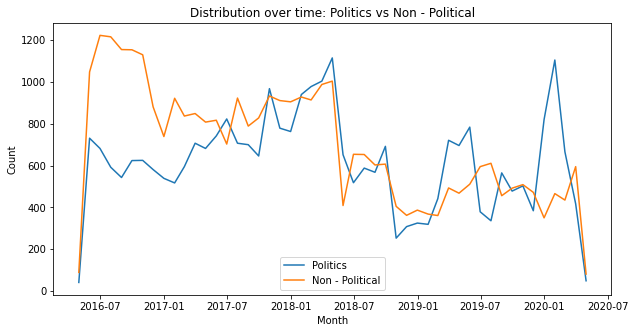

In [31]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Distribution over time: Politics vs Non - Political')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Count')
tmp = ax.plot(resamp['flair']['Politics'], label = "Politics")
tmp = ax.plot(resamp['flair']['Non-Political'], label = "Non - Political")
tmp = ax.legend()

What does this mean?

1. Political Activity was at a high between November 2017 and April 2018. After a slump in late 2018, there was a boost in political activity during the months of Feb-June 2019. This can of course be attributed to the general elections in India.

2. This plot shows that around 2016-2017, there were more non-political posts than there were political posts but this trend has been reversed in the last two years where the number of political and non-political posts has either been on par with each other or the number of political posts have outweighed the non-political posts.

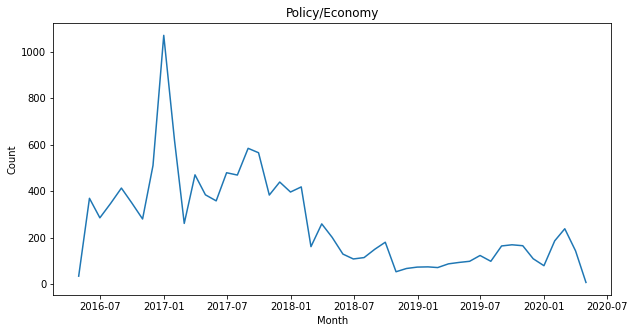

In [32]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Policy/Economy')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Count')
tmp = ax.plot(resamp['flair']['Policy/Economy'])

What does this mean?

1. A staggering outlier is found in November 2016 when posts about policy/economy boomed. This can be attributed to demonetization and it's vast impact on people of all economic backgrounds.

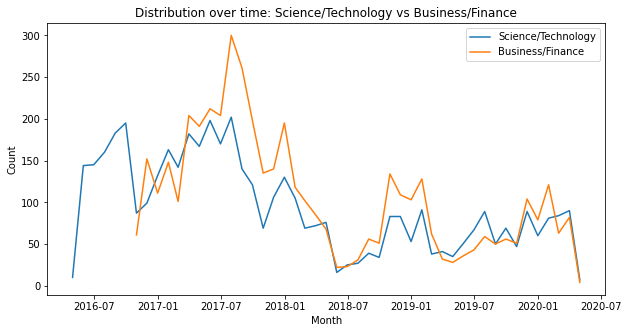

In [33]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Distribution over time: Science/Technology vs Business/Finance')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Count')
tmp = ax.plot(resamp['flair']['Science/Technology'], label = "Science/Technology")
tmp = ax.plot(resamp['flair']['Business/Finance'], label = "Business/Finance")
tmp = ax.legend()

What does this mean?

1. Business/Finance as a flair seems to have started only towards the end of 2016 which could again be tied to the demonetization in late 2016.
<br><br>
2. It is extremely interesting to see that the rise and the fall in the number of posts each month for both the flairs has been very similar. This shows that a breakthrough in Science/Technology soon impacts Business/Finance and that in today's digital world, Technology and Business have a very strong correlation.

In [34]:
y0 = df.loc[df['flair'] == 'Politics']['score']
y1 = df.loc[df['flair'] == 'Non-Political']['score']
y2 = df.loc[df['flair'] == 'Policy/Economy']['score']
y3 = df.loc[df['flair'] == 'AskIndia']['score']
y4 = df.loc[df['flair'] == 'Science/Technology']['score']
y5 = df.loc[df['flair'] == 'Business/Finance']['score']

trace0 = go.Box(
    y=y0,
    name = 'Politics',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Non-Political',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Policy/Economy',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'AskIndia',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Science/Technology',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Business/Finance',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "score Boxplot flair-wise"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "score Boxplot flair-wise")

What does this mean?

1. non-political posts are more appreciated than political. 
<br><br>
2. Science/Technology posts are more appealing to people than business/finance posts.

In [35]:
y0 = df.loc[df['flair'] == 'Politics']['num_comments']
y1 = df.loc[df['flair'] == 'Non-Political']['num_comments']
y2 = df.loc[df['flair'] == 'Policy/Economy']['num_comments']
y3 = df.loc[df['flair'] == 'AskIndia']['num_comments']
y4 = df.loc[df['flair'] == 'Science/Technology']['num_comments']
y5 = df.loc[df['flair'] == 'Business/Finance']['num_comments']

trace0 = go.Box(
    y=y0,
    name = 'Politics',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Non-Political',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Policy/Economy',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'AskIndia',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Science/Technology',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Business/Finance',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "comments Boxplot flair-wise"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "comments Boxplot flair-wise")

What does this mean?

1. It is surprising to see that discussion regarding political and non-political issues is roughly the same. 
<br><br>
2. You would expect AskIndia flair to have more comments and discussions than other flairs but it turns out that is not so.

## Inferences from Text Data

We have performed analysis on the numerical data we had. Now, we have to somehow process textual data.
In the end, analysis and comparison can be done only of numbers. This is why we wish to extract:

1. A number for each post according to it's sentiment(positive or negative)
2. Word count for each post
3. Most common words and phrases across all posts

We will use a library called textBlob to tell us about the sentiment.
Let us first extract sentiment and word count for each post and that data to our dataFrame

In [36]:
df['polarity'] = df['full_text'].map(lambda text: TextBlob(text).sentiment.polarity)
df['word_count'] = df['full_text'].apply(lambda x: len(str(x).split()))

Let us test out the sentiment polarity to see how it worked

In [37]:
max_polarity = df['polarity'].max()
df.loc[df['polarity'] == max_polarity, ['full_text']]

,full_text
71,"Breaking News : UNESCO has just declared India's Prime Minister as the best Event Management expert in the world. Go Corona, Corona Go..."
88,happy diwali guys!
144,Happy diwali everyone!
174,That's great!
803,Trip to Muttom Beach | Kaniyakumari South India | Tour Trip to Best Place
...,...
143077,Flud - Torrent Downloader is made in India and has the best interface for a torrent app
143182,Happy Mothers Day /r/india!
143480,Best 100+ Startup Ideas India online+offline – Indian Startups
143767,Which is the best telecom operator in India?


In [38]:
min_polarity = df['polarity'].min()
df.loc[df['polarity'] == min_polarity, ['full_text']]

,full_text
361,Wtf!!!!
829,"""Disinfectant"" Sprayed On Migrants On Return To UP, Shows Shocking Video"
989,This is just counter productive and shocking
1488,Shocking Deadliest Outbreaks and Pandemics in History Before COVID-19
1503,The billion-person question - If covid-19 takes hold in India the toll will be grim | Asia | The Economist
...,...
142544,TIFU by sending my prospective employer terribly written erotica
142641,Shocking: Dalit woman hacked to death after her brother elopes with caste Hindu girl
142775,Man who lodged case against PM for ‘insulting’ the national flag claims assault
143691,Shocking: A child expelled from school because his parents 'sell tea'


Alright, we can be convinced that this worked reasonably well. Let us now see the mean sentiment of all posts and then do a comparison with the mean sentiments of political vs non-political posts

In [39]:
mean_sentiment = df['polarity'].mean()
mean_political_sentiment = df[df['flair']=='Politics']['polarity'].mean()
mean_non_political_sentiment = df[df['flair']=='Non-Political']['polarity'].mean()
print('mean sentiment: ', mean_sentiment,'\nmean political sentiment: ',mean_political_sentiment,'\nmean non political sentiment: ',mean_non_political_sentiment)

mean sentiment:  0.047361911064165034 
mean political sentiment:  0.022399006100028276 
mean non political sentiment:  0.050433675091891124


What does this mean?

1. Mean sentiment of the sub-reddit is positive
<br><br>
2. As one would expect, Political posts are negative in comparison to non-political posts

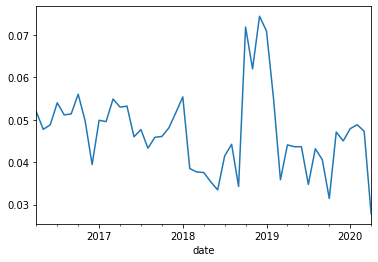

In [40]:
dfn = df.set_index('date')
polarity_resample = dfn['polarity'].resample('M').mean()
polarity_resample.plot()

What does this mean?

1. Sharp decrease in late 2016 which is possibly due to demonetization
2. A sharp increase in the second half of 2018
3. We notice a sharp fall in sentiment towards February and March of 2020. This is possibly due to the COVID-19 pandemic

In [41]:
flair_group = dfn.groupby('flair')
resamp = flair_group['polarity'].resample('M').mean()

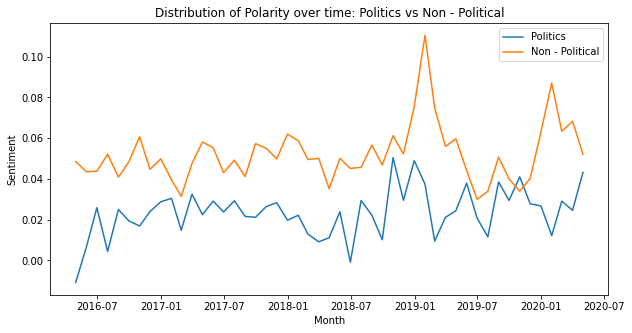

In [42]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Distribution of Polarity over time: Politics vs Non - Political')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Sentiment')
tmp = ax.plot(resamp['Politics'], label = "Politics")
tmp = ax.plot(resamp['Non-Political'], label = "Non - Political")
tmp = ax.legend()

What does this mean?

1. Political sentiment is consistently below non-political post sentiment. Beginning of 2019 saw the largest difference in Political and Non-political sentiment possibly due to the Pulwama attacks in Feb' 2019

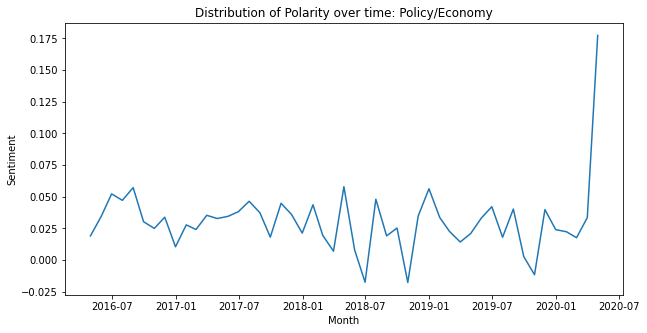

In [43]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Distribution of Polarity over time: Policy/Economy')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Sentiment')
tmp = ax.plot(resamp['Policy/Economy'])

What does this mean?

1. The sentiment regarding Policy/Economy has been more negative than political sentiment and has gone below 0 in multiple months.

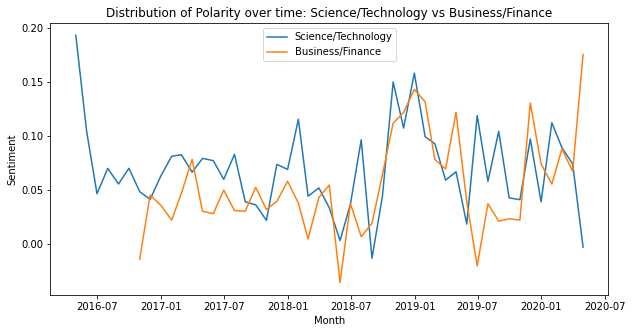

In [44]:
fig, ax = plt.subplots(figsize=(10,5))
tmp = ax.set_title('Distribution of Polarity over time: Science/Technology vs Business/Finance')
tmp = ax.set_xlabel('Month')
tmp = ax.set_ylabel('Sentiment')
tmp = ax.plot(resamp['Science/Technology'], label = "Science/Technology")
tmp = ax.plot(resamp['Business/Finance'], label = "Business/Finance")
tmp = ax.legend()

In [45]:
df['word_count'].iplot(
    kind='hist',
    xTitle='word count',
    linecolor='black',
    yTitle='num posts',
    title='word count plot')

Most posts(86.68% posts) have a word count between 0 and 50 and hence these posts mostly just contain a title and a link or a photgraph as the main body. Having said that, the outliers of this statistic lie close to a staggering 4000 words per post.

We will now use NLTK to get the most popular words and phrases using unigrams, bigrams and trigrams 

In [46]:
def get_top_n_grams(corpus, n,dim):
    vec = CountVectorizer(stop_words='english',ngram_range=(dim, dim)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [47]:
common_words = get_top_n_grams(df['full_text'], 20, 1)
df3 = pd.DataFrame(common_words, columns = ['full_text' , 'count'])
df3.groupby('full_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words from all posts')

In [48]:
common_words = get_top_n_grams(df['full_text'], 20, 2)
df3 = pd.DataFrame(common_words, columns = ['full_text' , 'count'])
df3.groupby('full_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in full text')

In [49]:
common_words = get_top_n_grams(df['full_text'], 50, 3)
df3 = pd.DataFrame(common_words, columns = ['full_text' , 'count'])
df3.groupby('full_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 50 trigrams in full text')

These phrases and words give us an insight into the most common kind of discussions that go on ranging from political figues such as Modi to bot posts such as the beep boop bot. News discussion is very common as we can see from the bigram "year old" as many news items have in the "12 year old ..." etc.

In [50]:
df.corr().iplot(kind='heatmap',colorscale="Blues",title="Feature Correlation Matrix")

There is a correlation between score and the number of comments that is very apparent. There is a slight correlation between score-wordcount, score-polarity and num_comments-wordcount. This shows that people appreciate the effort of a person who put in time to write the post himself/herself and give it upvotes as well as replies in the comment section

# THE END